In [92]:
import pandas as pd
import requests as r
import json
import matplotlib.pyplot as plt

In [95]:
!ls

chain-dataset-All.csv  curve.csv  LP.ipynb   response_1679249456541.json
chains.csv	       LICENSE	  README.md  response_1679413470833_curve.json


In [93]:
dfCurve = pd.read_csv("curve.csv", header=[0,1,2,3,4])

In [94]:
dfCurve

Unnamed: 0_level_0               Date          Timestamp  \
     Unnamed: 0_level_1 Unnamed: 1_level_1 Unnamed: 2_level_1   
     Unnamed: 0_level_2 Unnamed: 1_level_2 Unnamed: 2_level_2   
     Unnamed: 0_level_3 Unnamed: 1_level_3 Unnamed: 2_level_3   
     Unnamed: 0_level_4 Unnamed: 1_level_4 Unnamed: 2_level_4   
0                   NaN         09/02/2020         1581206400   
1                   NaN         10/02/2020         1581292800   
2                   NaN         11/02/2020         1581379200   
3                   NaN         12/02/2020         1581465600   
4                   NaN         13/02/2020         1581552000   
...                 ...                ...                ...   
1132                NaN         17/03/2023         1679011200   
1133                NaN         18/03/2023         1679097600   
1134                NaN         19/03/2023         1679184000   
1135                NaN         20/03/2023         1679270400   
1136                NaN         21/03/2023         1679356800   

                  Curve                                        \
                  Dexes                                         
               optimism               kava              Total   
                    TVL                TVL                TVL   
     Unnamed: 3_level_4 Unnamed: 4_level_4 Unnamed: 5_level_4   
0                   NaN                NaN       1.163733e+06   
1                   NaN                NaN       1.372110e+06   
2                   NaN                NaN       9.607534e+05   
3                   NaN                NaN       1.006408e+06   
4                   NaN                NaN       1.258776e+06   
...                 ...                ...                ...   
1132       8.260064e+07       1.055498e+07       4.267782e+09   
1133       8.533990e+07       1.084010e+07       4.474331e+09   
1134       8.370464e+07       1.073052e+07       4.460486e+09   
1135       8.327522e+07       1.089618e+07       4.493107e+09   
1136       8.224371e+07       1.089480e+07       4.638972e+09   

                                                               \
                                                                
                harmony           moonbeam           ethereum   
                    TVL                TVL                TVL   
     Unnamed: 6_level_4 Unnamed: 7_level_4 Unnamed: 8_level_4   
0                   NaN                NaN       1.163733e+06   
1                   NaN                NaN       1.372110e+06   
2                   NaN                NaN       9.607534e+05   
3                   NaN                NaN       1.006408e+06   
4                   NaN                NaN       1.258776e+06   
...                 ...                ...                ...   
1132                0.0       2.167379e+06       3.982212e+09   
1133                0.0       2.365179e+06       4.179025e+09   
1134                0.0       2.206247e+06       4.166328e+09   
1135                0.0       2.195435e+06       4.188791e+09   
1136                0.0       2.106916e+06       4.334698e+09   

                         ...                                         \
                         ...                                          
                 aurora  ...  avalanche                               
                    TVL  ...     Tokens                               
     Unnamed: 9_level_4  ...     AVWBTC         AVDAI        AVUSDT   
0                   NaN  ...        NaN           NaN           NaN   
1                   NaN  ...        NaN           NaN           NaN   
2                   NaN  ...        NaN           NaN           NaN   
3                   NaN  ...        NaN           NaN           NaN   
4                   NaN  ...        NaN           NaN           NaN   
...                 ...  ...        ...           ...           ...   
1132       17532.505069  ...  44.768999  4.237792e+06  1.570217e+06   
1133       17550.543222  ...  

In [9]:
chains = pd.read_csv("chains.csv")

In [10]:
chains

,Timestamp,Date,Ethereum,Tron,BSC,Arbitrum,Polygon,Optimism,Avalanche,Fantom,...,Kusama,CosmosHub,Stafi,Stride,Persistence,Hoo,Echelon,zkSync,Coti,Thorchain
0,1596326400,2020-08-02,3.616942e+09,2.068340e+07,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1596412800,2020-08-03,3.541694e+09,1.959327e+07,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1596499200,2020-08-04,3.683975e+09,2.034859e+07,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1596585600,2020-08-05,3.759960e+09,2.085303e+07,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1596672000,2020-08-06,4.989795e+09,2.136599e+07,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
955,1678838400,2023-03-15,3.235765e+10,4.865050e+09,5.623159e+09,1.899608e+09,1.177518e+09,1.040046e+09,9.568703e+08,5.022847e+08,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
956,1678924800,2023-03-16,3.145268e+10,4.814592e+09,5.860251e+09,1.949846e+09,1.148697e+09,1.015593e+09,9.246786e+08,4.871572e+08,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
957,1679011200,2023-03-17,3.137623e+10,4.851414e+09,5.656648e+09,2.057913e+09,1.161309e+09,1.064051e+09,9.335985e+08,4.962389e+08,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
958,1679097600,2023-03-18,3.294757e+10,5.358049e+09,5.827601e+09,2.200654e+09,1.212022e+09,1.130699e+09,9.784225e+08,5.352763e+08,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


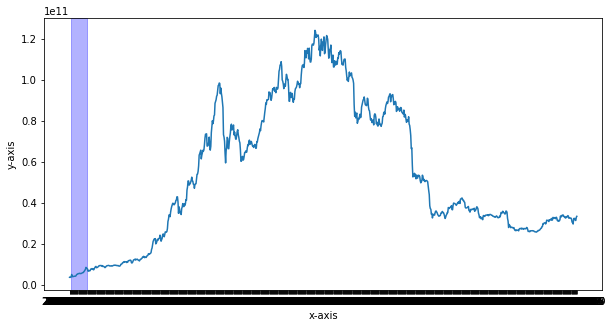

In [65]:
fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(chains.Date.values, chains.Ethereum.values)

# adjust labels
#ax.set_ylabel("GDP")
ax.axvspan("2020-08-04", "2020-09-04", color="blue", alpha=0.3)
ax.set_xlabel('x-axis')
ax.set_ylabel('y-axis')
# assign title
#ax.set_title("GDP of country over years", size=15)
plt.show()

<AxesSubplot:xlabel='Date'>

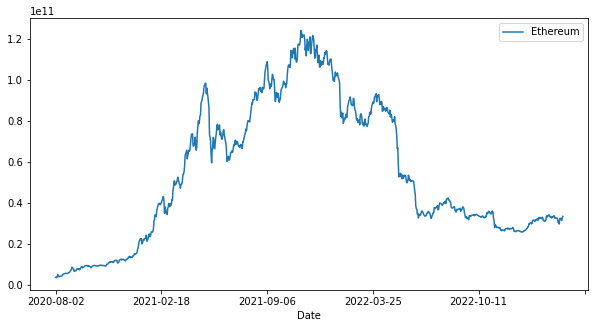

In [11]:
chains.plot(x='Date', y='Ethereum', figsize = (10, 5))

In [42]:
with open('response_1679249456541.json') as json_data:
    data = json.load(json_data)
    print(data.keys())

dict_keys(['id', 'name', 'url', 'description', 'logo', 'gecko_id', 'cmcId', 'chains', 'twitter', 'governanceID', 'currentChainTvls', 'chainTvls', 'tokens', 'tokensInUsd', 'tvl', 'isParentProtocol', 'metrics', 'raises', 'otherProtocols', 'hallmarks'])


In [59]:
dfUniHallmarks= pd.DataFrame(data['hallmarks'])

In [62]:
dfUniHallmarks[0]=pd.to_datetime(dfUniHallmarks[0], unit='s')

In [63]:
dfUniHallmarks

,0,1
0,2020-05-04 16:34:02,UNI V2 Launch
1,2020-08-26 03:21:47,SushiSwap launch
2,2020-09-08 03:21:47,SushiSwap migration
3,2020-09-16 03:21:47,LM starts
4,2020-11-17 03:21:47,LM ends
5,2021-04-02 03:21:47,FEI launch
6,2021-05-04 19:27:00,UNI V3 Launch


In [52]:
data['tokensInUsd']

[{'date': 1620259200,
  'tokens': {'VAL': 38240.9426,
   'MATIC': 189413.05983,
   'SHIB': 9448.88953,
   'ZAP': 33569.79912,
   'GLQ': 11448.28089,
   'COMP': 412687.72515,
   'RBC': 24003.83485,
   'CHONK': 6427.46634,
   'NFTX': 2087846.66275,
   'LYXE': 16969.54378,
   'TFL': 1078.48969,
   'RUNE': 86153.1163,
   'MINDS': 12330.34122,
   'FORTH': 173309.34751,
   'BANK': 26949.56777,
   'DOV': 4625.04642,
   'CEL': 2005407.04158,
   '1INCH': 479518.14215,
   'AMPL': 0,
   'POOL': 19165.30025,
   'XOR': 250564.60225,
   'FTM': 215083.84214,
   'PUSH': 796.72978,
   'ETH2X-FLI': 3830676.63643,
   'PROS': 38241.02538,
   'ALEPH': 136770.31073,
   'CFI': 4242.45693,
   'ANKR': 2275.48209,
   'RENDOGE': 66918.47643,
   'ZCX': 4010.49456,
   'PENDLE': 71.57221,
   'LPT': 35343.89849,
   'WBTC': 10675708.62035,
   'SNX': 8931.61797,
   '⚗️': 109935.17065,
   'BMI': 2727.26117,
   'WOA': 202446.28293,
   'DAI': 5567443.15254,
   'ECO': 515364.41106,
   'DAM': 129065.01928,
   'MKR': 706074

In [51]:
pd.DataFrame(data['tokens'])

,date,tokens
0,1620259200,"{'VAL': 5386.12007, 'MATIC': 232512.00279, 'SH..."
1,1620345600,"{'B20': 49955.39639, 'MATIC': 1178324.69252, '..."
2,1620432000,"{'B20': 46445.14535, 'MATIC': 1710844.49832, '..."
3,1620518400,"{'B20': 47806.87734, 'MATIC': 1217841.51862, '..."
4,1620604800,"{'B20': 45020.20224, 'MATIC': 998680.55136, 'D..."
...,...,...
674,1678924800,"{'AGLD': 39252.49911, 'RENBTC': 5.14785, 'KUJI..."
675,1679011200,"{'AGLD': 39252.49911, 'RENBTC': 5.16064, 'KUJI..."
676,1679097600,"{'AGLD': 39252.49911, 'RENBTC': 4.82288, 'KUJI..."
677,1679184000,"{'AGLD': 39252.49911, 'RENBTC': 4.70989, 'KUJI..."


In [47]:
data['cmcId']

'7083'

In [41]:
data['chainTvls'].keys()

dict_keys(['Ethereum', 'Optimism', 'BSC', 'Polygon', 'Celo', 'Arbitrum'])

In [55]:
pd.read_csv('chain-dataset-All.csv')

,Protocol,03/11/2018,04/11/2018,05/11/2018,06/11/2018,07/11/2018,08/11/2018,09/11/2018,10/11/2018,11/11/2018,...,10/03/2023,11/03/2023,12/03/2023,13/03/2023,14/03/2023,15/03/2023,16/03/2023,17/03/2023,18/03/2023,19/03/2023
0,Total,34643.89061,41268.183107,40551.782624,43091.340148,153979.388674,180229.002757,175773.261732,172207.675785,187642.439533,...,1.759418e+10,1.720996e+10,1.547377e+10,1.667010e+10,1.718318e+10,1.751639e+10,1.712424e+10,1.715252e+10,1.799501e+10,1.807707e+10
1,Uniswap V1,34643.89061,41268.183107,40551.782624,43091.340148,153979.388674,180229.002757,175773.261732,172207.675785,187642.439533,...,7.963155e+06,7.947198e+06,8.004366e+06,8.165693e+06,8.578275e+06,8.576508e+06,8.676551e+06,8.702948e+06,8.983857e+06,8.927616e+06
2,Curve,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.633726e+09,4.530689e+09,3.875405e+09,4.024964e+09,4.155010e+09,4.224531e+09,4.147585e+09,4.267782e+09,4.474331e+09,4.526279e+09
3,Balancer V1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.219450e+08,1.236169e+08,1.208389e+08,1.342161e+08,1.381986e+08,1.422719e+08,1.344207e+08,1.348890e+08,1.464553e+08,1.458365e+08
4,Uniswap V2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.007920e+09,1.018100e+09,1.028511e+09,1.059074e+09,1.069042e+09,1.081402e+09,1.049508e+09,1.066618e+09,1.145308e+09,1.128733e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,MetaCoin Swap,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.398283e+05,1.392734e+05,1.378198e+05,1.366754e+05,1.397959e+05,1.390102e+05
706,Ramses Exchange,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,3.368071e+05,1.241387e+06,3.470499e+07,5.596576e+07,5.845061e+07
707,Arbitrum Exchange,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.200992e+06,1.569083e+07
708,OpenXswap,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.097538e+05,4.128540e+05
